In [18]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import rasterio

# Loading the data

In [19]:
img = cv2.imread('../data/20230215-SE2B-CGG-GBR-MS3-L3-RGB-preview.jpg', cv2.IMREAD_COLOR)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [20]:
def show_img(img):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(img, cmap='plasma')
    plt.colorbar()
    plt.show()

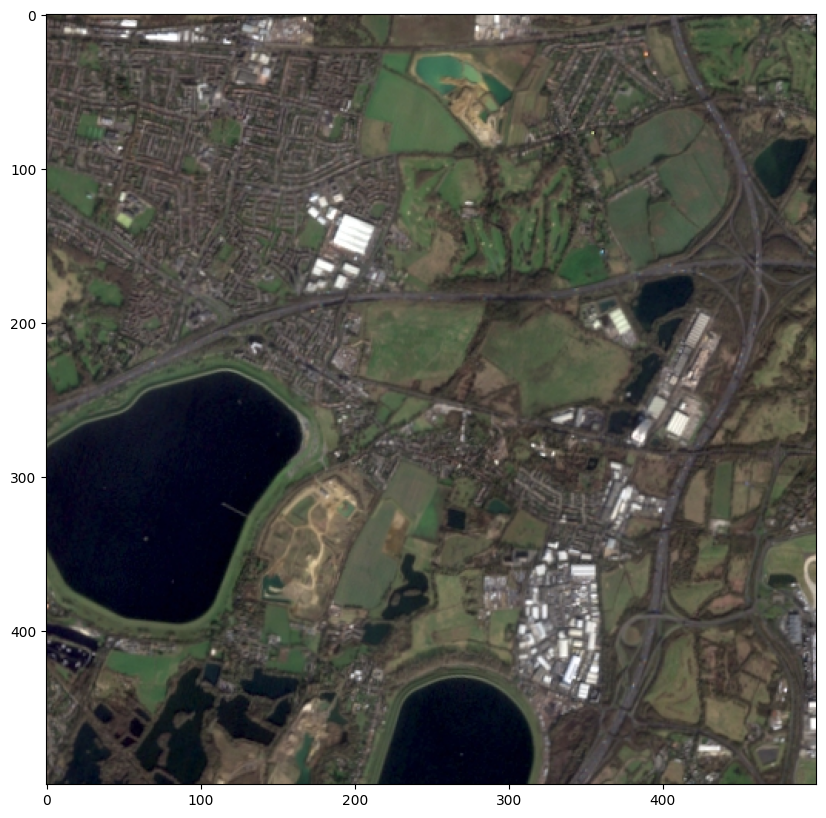

In [21]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(img)
plt.show()

In [22]:
with rasterio.open("../data/DSM_TQ0075_P_12757_20230109_20230315.tif") as src:
    lidar = src.read(1)


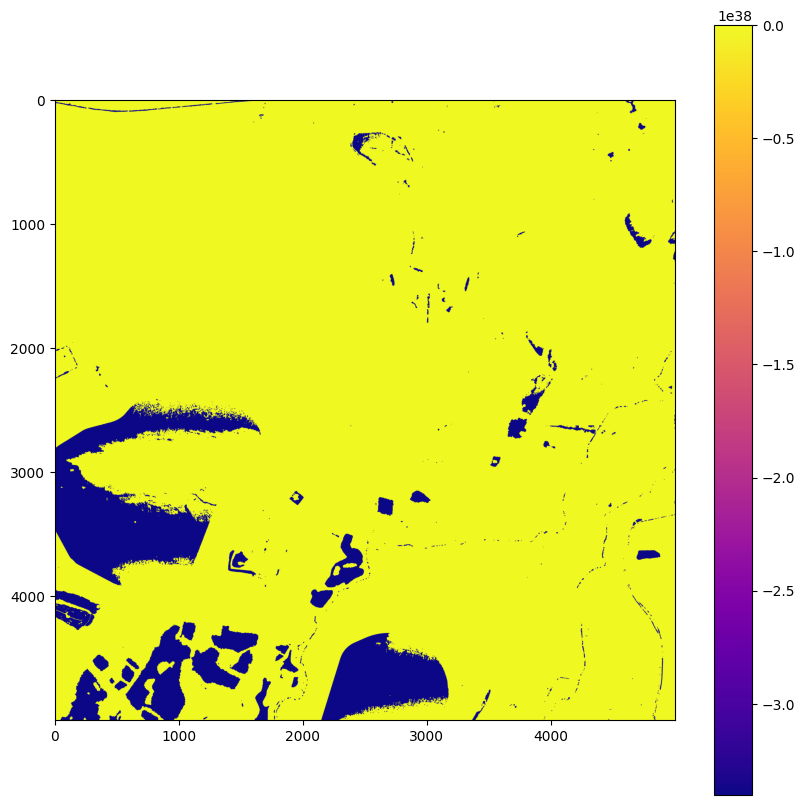

In [23]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(lidar, cmap='plasma')
plt.colorbar()
plt.show()

log the lidar data

/tmp/ipykernel_479513/160975520.py:3: RuntimeWarning: invalid value encountered in log2
  log_lidar = np.log2(lidar)  # log(1+x) where x is shifted to be non-lid


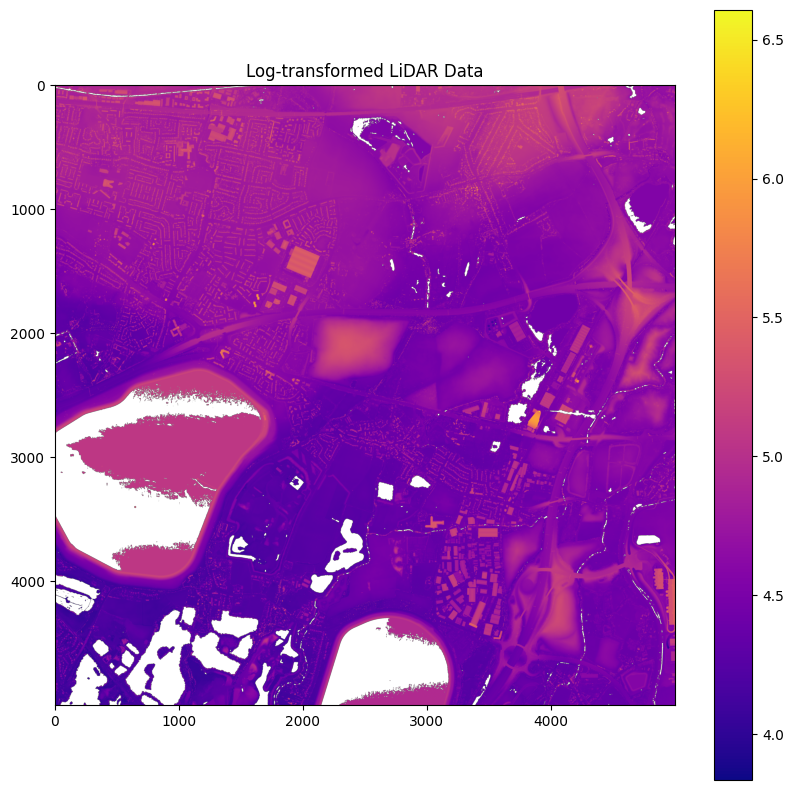

In [35]:
# Apply logarithmic transformation to compress the range of values
# Add a small value to avoid log(0) issues
log_lidar = np.log2(lidar)  # log(1+x) where x is shifted to be non-lid

# Plot the logged LiDAR data
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(log_lidar, cmap='plasma')
plt.colorbar()
plt.title('Log-transformed LiDAR Data')
plt.show()

# Try and remove lakes

my idea is im going to find the darkest pixels in the image, and then remove the bottom 5%.

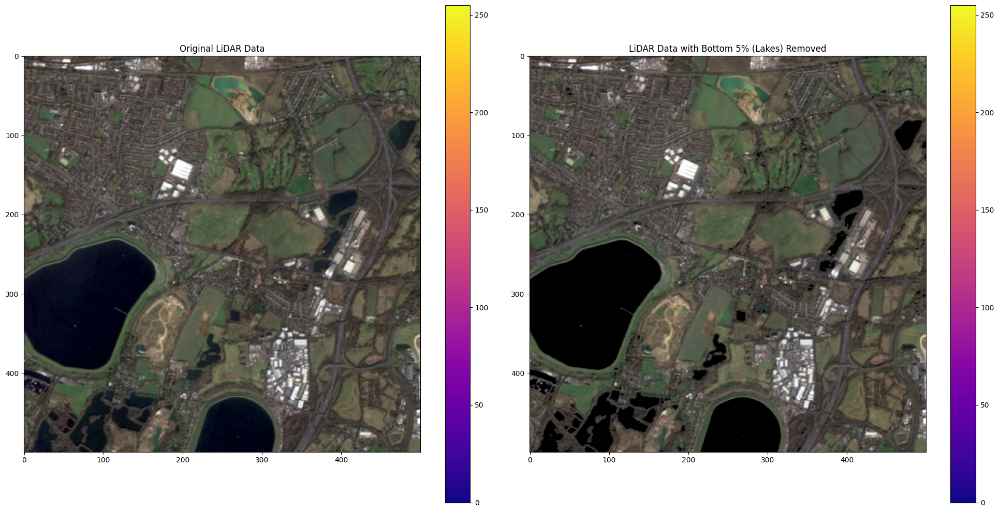

Threshold value: 34.00
Removed 89205 pixels (11.89% of the image)


In [40]:
# Calculate the threshold for the bottom 5% of pixel values
threshold = np.percentile(img, 12)

# Create a masked version of the image where values below threshold are removed
lake_mask = img.copy()
# Set pixels below threshold to a specific value (e.g., 0)
mask = np.any(img < threshold, axis=2)  # Create mask where any RGB channel is below threshold
lake_mask[mask] = 0  # Set masked pixels to black

# Display the result
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Original image
im1 = axes[0].imshow(img, cmap='plasma')
axes[0].set_title('Original LiDAR Data')
plt.colorbar(im1, ax=axes[0])

# Image with lakes removed
im2 = axes[1].imshow(lake_mask, cmap='plasma')
axes[1].set_title('LiDAR Data with Bottom 5% (Lakes) Removed')
plt.colorbar(im2, ax=axes[1])

plt.tight_layout()
plt.show()

# Print statistics about the removal
removed_pixels = np.sum(img < threshold)
percentage = (removed_pixels / img.size) * 100
print(f"Threshold value: {threshold:.2f}")
print(f"Removed {removed_pixels} pixels ({percentage:.2f}% of the image)")

# get log lidar no greenery

In [33]:
# Read the NRG image using OpenCV
nrg_img = cv2.imread("../data/20230215-SE2B-CGG-GBR-MS3-L3-NRG-preview.jpg", cv2.IMREAD_COLOR)

# Split the NRG image into its respective bands
nir_band = nrg_img[:, :, 0].astype(float)  # Near-Infrared band
red_band = nrg_img[:, :, 2].astype(float)  # Red band

# Subtract the bands
band_difference = nir_band - red_band

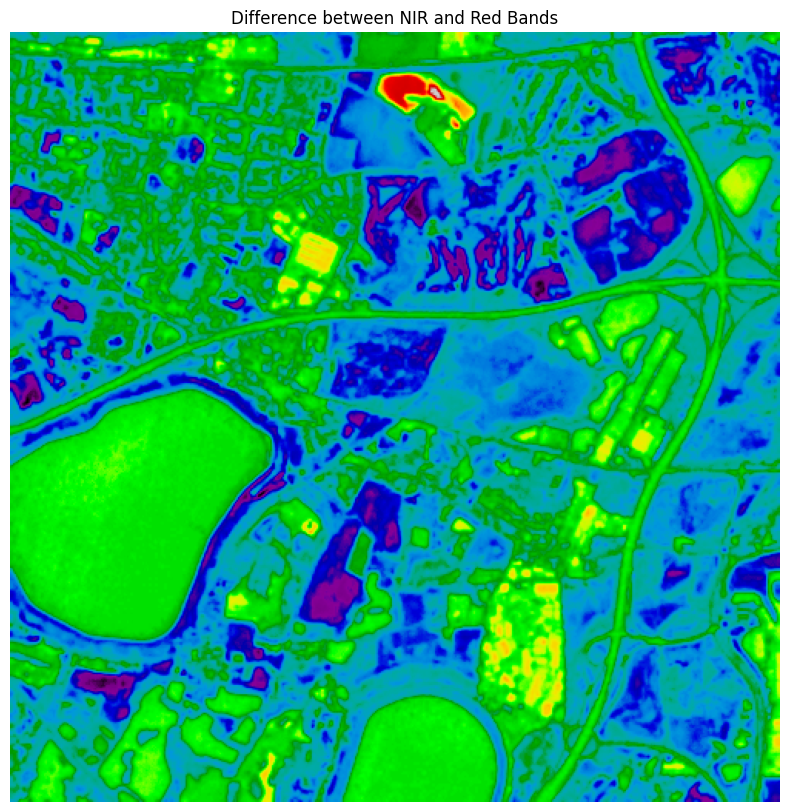

In [34]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(band_difference, cmap='nipy_spectral')
ax.set_title('Difference between NIR and Red Bands')
ax.axis('off')

plt.show()

In [37]:
# Define a threshold for the band difference to identify greenery
greenery_threshold = -50

# Create a mask for areas that are not greenery
non_greenery_mask = band_difference > greenery_threshold

# Resize the mask to match the shape of above_ground_lidar_data
non_greenery_mask_resized = cv2.resize(non_greenery_mask.astype(np.uint8), (log_lidar.shape[1], log_lidar.shape[0]), interpolation=cv2.INTER_NEAREST).astype(bool)

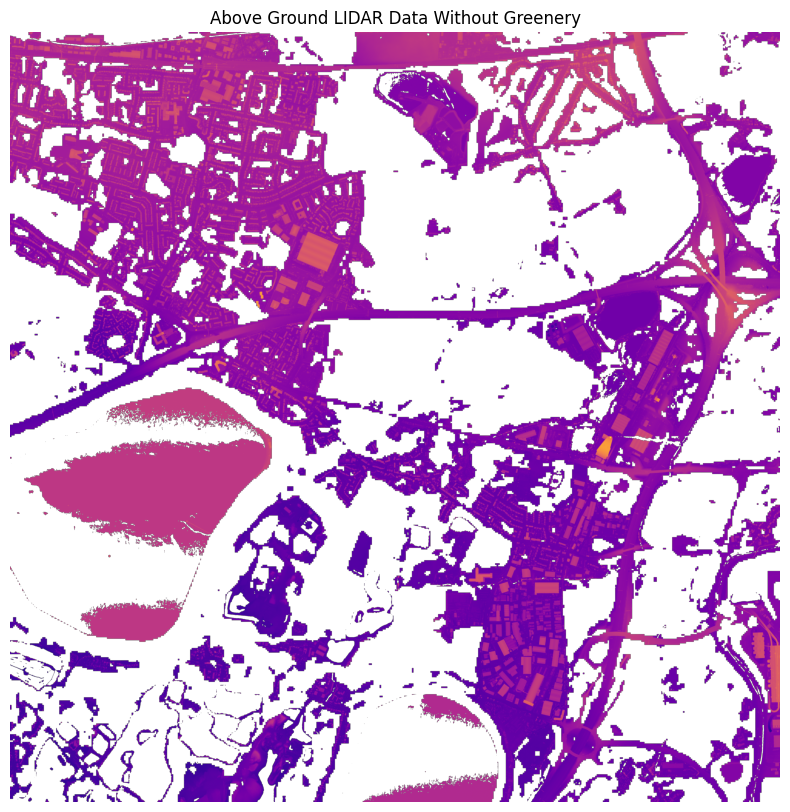

In [38]:
# Apply the resized mask to the above ground LIDAR data
above_ground_lidar_data_no_greenery = np.where(non_greenery_mask_resized, log_lidar, np.nan)

# Plot the filtered LIDAR data without greenery
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(above_ground_lidar_data_no_greenery, cmap='plasma')
ax.set_title('Above Ground LIDAR Data Without Greenery')
ax.axis('off')

plt.show()

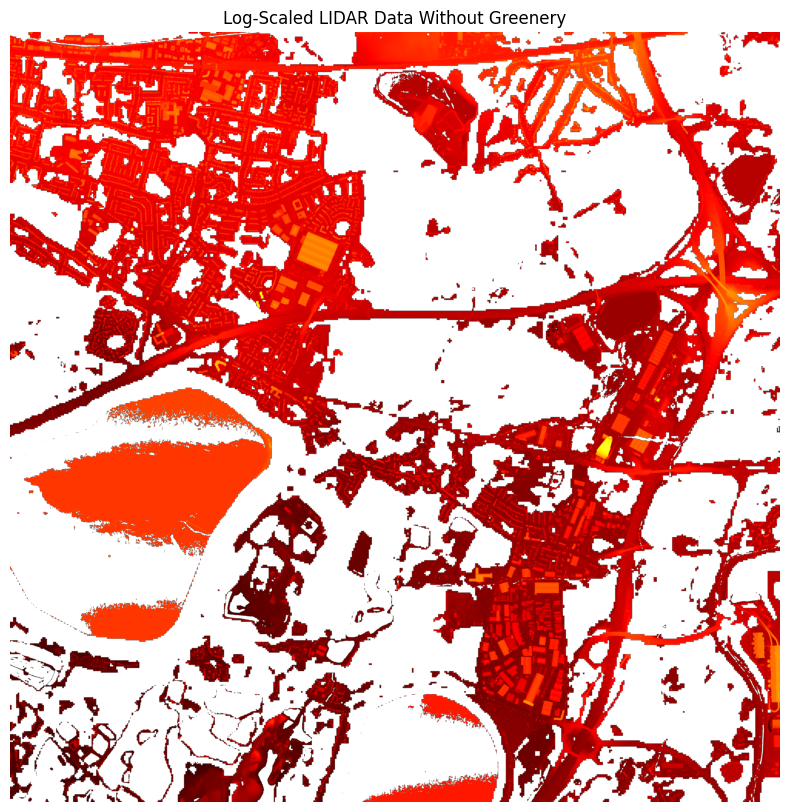

In [39]:
# Apply the resized mask to the log-scaled LIDAR data
log_lidar_data_no_greenery = np.where(non_greenery_mask_resized, log_lidar, np.nan)

# Plot the filtered log-scaled LIDAR data without greenery
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(log_lidar_data_no_greenery, cmap='hot')
ax.set_title('Log-Scaled LIDAR Data Without Greenery')
ax.axis('off')

plt.show()

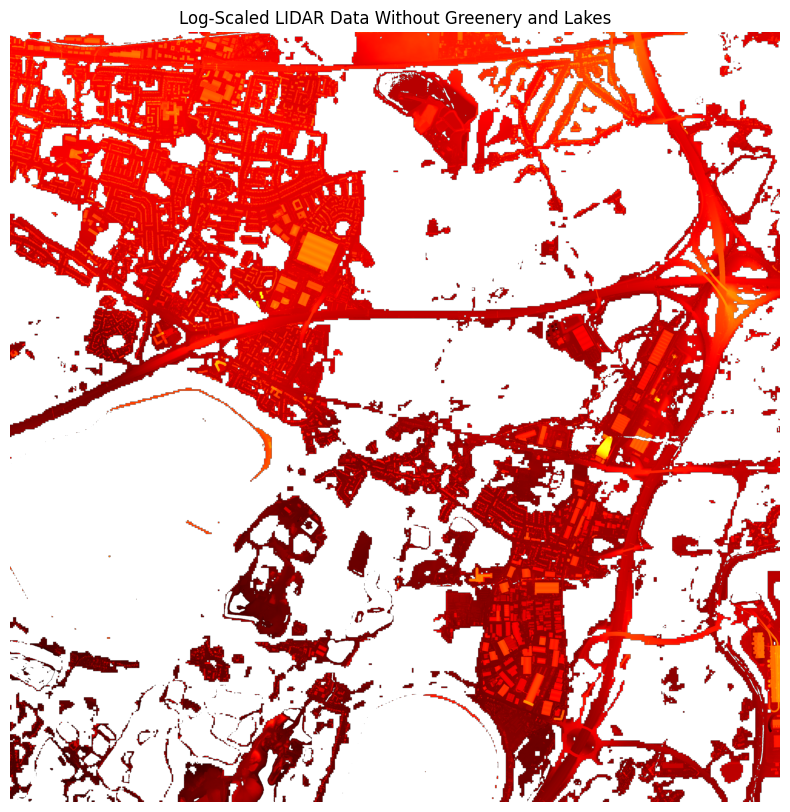

In [47]:
# Create a binary mask from lake_mask (1 where there are features, 0 where there are lakes)
binary_mask = np.any(lake_mask > 0, axis=2)  # Convert RGB mask to binary mask

# Resize binary mask to match lidar data dimensions
lake_mask_resized = cv2.resize(binary_mask.astype(np.uint8), 
							  (log_lidar_data_no_greenery.shape[1], log_lidar_data_no_greenery.shape[0]), 
							  interpolation=cv2.INTER_NEAREST).astype(bool)

# Apply the resized mask to the lidar data
log_lidar_data_no_greenery_no_lake = np.where(lake_mask_resized, log_lidar_data_no_greenery, np.nan)

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(log_lidar_data_no_greenery_no_lake, cmap='hot')
ax.set_title('Log-Scaled LIDAR Data Without Greenery and Lakes')
ax.axis('off')
plt.show()

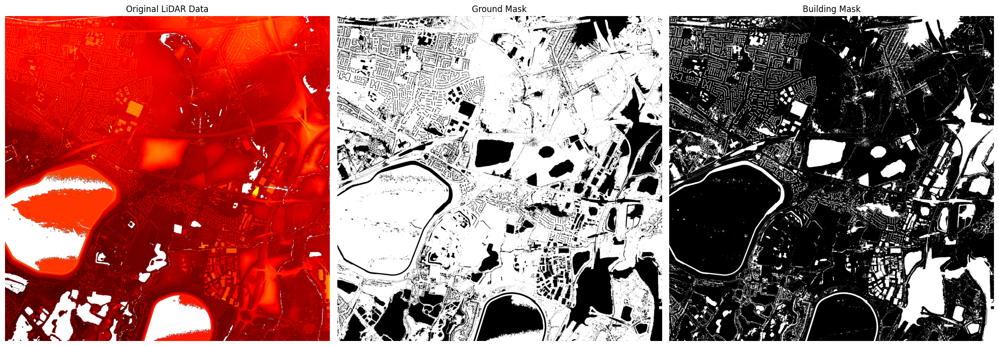

In [46]:
# Create a normalized 8-bit image for floodfill operations
# Replace NaN values with 0
floodfill_img = np.copy(log_lidar)
floodfill_img = np.nan_to_num(floodfill_img, nan=0).astype(np.float32)

# Scale to 0-255 for better visualization and processing
min_val_ff = np.min(floodfill_img)
max_val_ff = np.max(floodfill_img)
floodfill_img = ((floodfill_img - min_val_ff) / (max_val_ff - min_val_ff) * 255).astype(np.uint8)

# Create mask of valid data points (non-NaN areas in original data)
valid_area_mask = ~np.isnan(log_lidar)

# Create a mask for floodfill operation (must be larger than image by 2 pixels in each dimension)
h, w = floodfill_img.shape
flood_mask = np.zeros((h+2, w+2), dtype=np.uint8)

# Create output mask 
building_mask = np.zeros_like(floodfill_img)

# Set seed points along the edges for floodfill (assuming edges are non-buildings)
# We'll use multiple seed points around the perimeter
seed_points = []
step = 500  # Distance between seed points

# Add seed points at the edges
for i in range(0, w, step):
    seed_points.append((0, i))       # Top edge
    seed_points.append((h-1, i))     # Bottom edge
    
for i in range(0, h, step):
    seed_points.append((i, 0))       # Left edge
    seed_points.append((i, w-1))     # Right edge

# Set floodfill parameters
flood_diff = 5  # Tolerance for pixel difference in floodfill

# Apply floodfill from each seed point
for pt in seed_points:
    if valid_area_mask[pt]:  # Only use seed points in valid areas
        # Use floodfill to mark non-building areas
        cv2.floodFill(floodfill_img, flood_mask, pt, 255, 
                      loDiff=flood_diff, upDiff=flood_diff, 
                      flags=cv2.FLOODFILL_FIXED_RANGE)

# Invert to get building mask (buildings=255, non-buildings=0)
ground_mask = (floodfill_img == 255).astype(np.uint8) * 255
building_mask = 255 - ground_mask

# Apply to original valid data only
building_mask = building_mask * valid_area_mask.astype(np.uint8)

# Visualize the results
fig, axes = plt.subplots(1, 3, figsize=(20, 7))

axes[0].imshow(log_lidar, cmap='hot')
axes[0].set_title('Original LiDAR Data')
axes[0].axis('off')

axes[1].imshow(ground_mask, cmap='gray')
axes[1].set_title('Ground Mask')
axes[1].axis('off')

axes[2].imshow(building_mask, cmap='gray')
axes[2].set_title('Building Mask')
axes[2].axis('off')

plt.tight_layout()
plt.show()

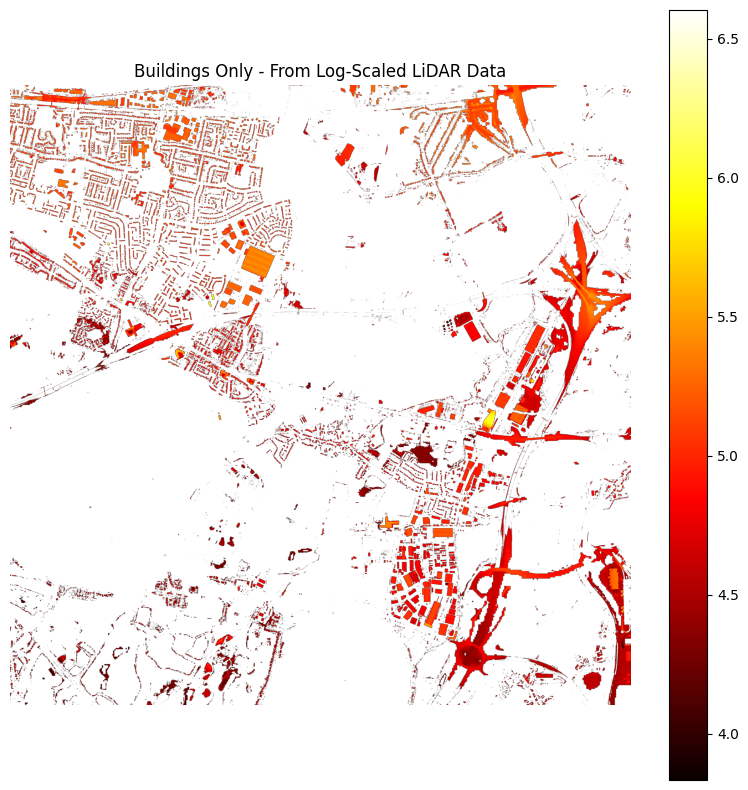

Number of building pixels identified: 2883773
Mean building height (log scale): 4.8547
Min building height (log scale): 3.8345
Max building height (log scale): 6.6026


In [48]:
# Convert building_mask to boolean (True where buildings exist)
building_bool_mask = (building_mask == 255)

# Apply the building mask to the processed LiDAR data to extract only buildings
buildings_lidar_data = np.where(building_bool_mask, log_lidar_data_no_greenery_no_lake, np.nan)

# Visualize the buildings-only LiDAR data
fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(buildings_lidar_data, cmap='hot')
ax.set_title('Buildings Only - From Log-Scaled LiDAR Data')
ax.axis('off')
plt.colorbar(im)
plt.show()

# Print some statistics about the buildings
valid_building_data = buildings_lidar_data[~np.isnan(buildings_lidar_data)]
if len(valid_building_data) > 0:
    print(f"Number of building pixels identified: {len(valid_building_data)}")
    print(f"Mean building height (log scale): {np.mean(valid_building_data):.4f}")
    print(f"Min building height (log scale): {np.min(valid_building_data):.4f}")
    print(f"Max building height (log scale): {np.max(valid_building_data):.4f}")
else:
    print("No building pixels were identified.")

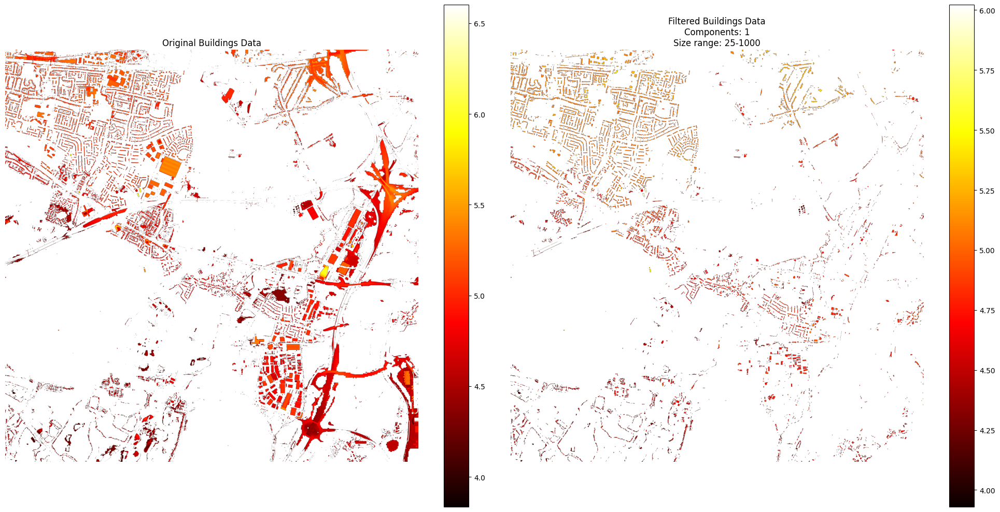

Total components: 38132
Min component size: 1
Max component size: 218679
Mean component size: 75.6
Components kept after filtering: 35.2%


In [49]:
# Convert buildings_lidar_data to a binary mask (1 where there's valid building data, 0 elsewhere)
binary_building_mask = ~np.isnan(buildings_lidar_data)
binary_building_mask = binary_building_mask.astype(np.uint8)

# Apply connected components analysis
min_size = 25  # Minimum size of buildings to keep
max_size = 1000  # Maximum size of buildings (remove larger components)
num_labels, labels_im = cv2.connectedComponents(binary_building_mask)

# Filter components based on size
filtered_building_mask = np.zeros_like(binary_building_mask)
sizes = []
for label in range(1, num_labels):
    label_mask = labels_im == label
    label_size = np.sum(label_mask)
    sizes.append(label_size)
    if min_size <= label_size <= max_size:
        filtered_building_mask[label_mask] = 1

# Apply the filtered mask to the original data
filtered_buildings_lidar_data = np.where(filtered_building_mask == 1, buildings_lidar_data, np.nan)

# Visualize the results
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Original buildings data
im1 = axes[0].imshow(buildings_lidar_data, cmap='hot')
axes[0].set_title('Original Buildings Data')
axes[0].axis('off')
plt.colorbar(im1, ax=axes[0])

# Filtered buildings data
im2 = axes[1].imshow(filtered_buildings_lidar_data, cmap='hot')
axes[1].set_title(f'Filtered Buildings Data\nComponents: {np.max(filtered_building_mask)}\nSize range: {min_size}-{max_size}')
axes[1].axis('off')
plt.colorbar(im2, ax=axes[1])

plt.tight_layout()
plt.show()

# Print statistics about the components
if sizes:
    print(f"Total components: {len(sizes)}")
    print(f"Min component size: {min(sizes)}")
    print(f"Max component size: {max(sizes)}")
    print(f"Mean component size: {np.mean(sizes):.1f}")
    print(f"Components kept after filtering: {np.sum(filtered_building_mask > 0) / np.sum(binary_building_mask > 0):.1%}")

In [51]:
# save the filtered building lidar data
with rasterio.open("../data/filtered_building_lidar_data.tif", 'w', driver='GTiff',
                   height=filtered_buildings_lidar_data.shape[0], width=filtered_buildings_lidar_data.shape[1],
                   count=1, dtype=str(filtered_buildings_lidar_data.dtype), crs=src.crs, transform=src.transform) as dst:
    dst.write(filtered_buildings_lidar_data, 1)

In [52]:
# test the saved file
with rasterio.open("../data/filtered_building_lidar_data.tif") as src:
    filtered_buildings_lidar_data_2 = src.read(1)

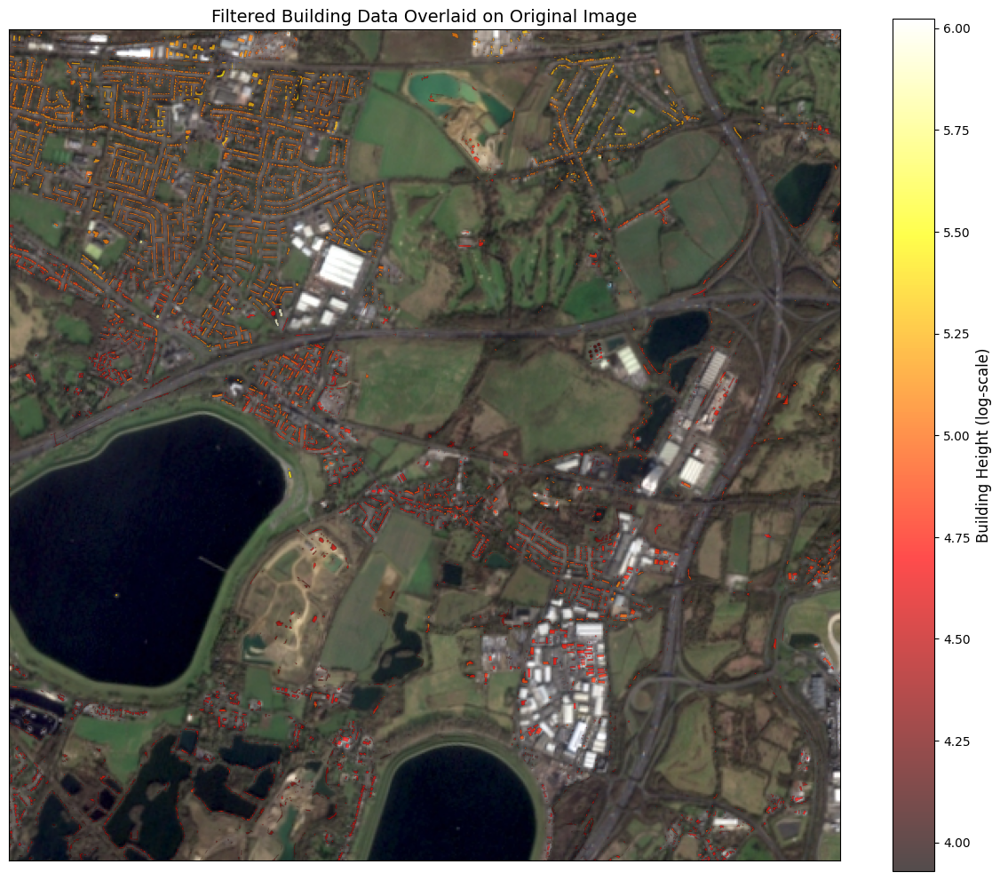

In [53]:
# Create a visualization of the filtered building data on top of the original image

# Resize the original RGB image to match the lidar data dimensions
resized_img = cv2.resize(img, (lidar.shape[1], lidar.shape[0]), interpolation=cv2.INTER_NEAREST)

# Create figure for visualization
fig, ax = plt.subplots(figsize=(12, 10))

# Display the original image
ax.imshow(resized_img)

# Create a mask for where we have valid building data (non-NaN values)
valid_building_mask = ~np.isnan(filtered_buildings_lidar_data)

# Get the height values only where we have buildings
building_heights = np.copy(filtered_buildings_lidar_data)
building_heights[~valid_building_mask] = np.nan

# Display the building data with a colormap and some transparency
building_overlay = ax.imshow(building_heights, cmap='hot', alpha=0.7)
ax.set_title('Filtered Building Data Overlaid on Original Image', fontsize=14)

# Add a colorbar for the building heights
cbar = plt.colorbar(building_overlay, ax=ax)
cbar.set_label('Building Height (log-scale)', fontsize=12)

# Turn off axis ticks for cleaner visualization
ax.set_xticks([])
ax.set_yticks([])

plt.tight_layout()
plt.show()

In [56]:
# count how many buildings are in the filtered building data
# a building is a connected component in the filtered building data
concomp = cv2.connectedComponents(filtered_building_mask)

In [57]:
print(f"Number of buildings: {concomp[0] - 1}")

Number of buildings: 6326
